<a href="https://colab.research.google.com/github/CelikAbdullah/deep-learning-notebooks/blob/main/Deep%20Reinforcement%20Learning/Actor-Critic/TD3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Libraries

In [1]:
!pip install pybullet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.5/80.5 MB 11.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pybullet: filename=pybullet-3.2.5-cp310-cp310-linux_x86_64.whl size=101451637 sha256=0e2eef62af4c13a7c096a25586ce328fb0047ffccab94a6800b74da313aa26e8
  Stored in directory: /root/.cache/pip/wheels/6b/fa/1a/c315a5133f0c9bf202a6daa5d70891120e7fe403e06e3407cc
Successfully built pybullet


In [32]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
import pybullet
import pybullet_envs
import gym
import time
from itertools import count

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# Policy Network as Actor

We use the same policy network as in DDPG.

In [12]:
class PolicyNetwork(nn.Module):
  def __init__(self,
               input_dim,
               action_bounds,
               hidden_dims=(32,32),
               activation_fc=F.relu,
               out_activation_fc=F.tanh):

    super(PolicyNetwork, self).__init__()
    self.activation_fc = activation_fc
    self.out_activation_fc = out_activation_fc
    self.env_min, self.env_max = action_bounds

    # input layer
    self.input_layer = nn.Linear(input_dim, hidden_dims[0])

    # hidden layers
    self.hidden_layers = nn.ModuleList()
    for i in range(len(hidden_dims)-1):
      hidden_layer = nn.Linear(hidden_dims[i], hidden_dims[i+1])
      self.hidden_layers.append(hidden_layer)

    # output layer
    self.output_layer = nn.Linear(hidden_dims[-1], len(self.env_max))

    device = "cpu"
    if torch.cuda.is_available():
      device = "cuda:0"
    self.device = torch.device(device)
    self.to(self.device)

    self.env_min = torch.tensor(self.env_min,
                                device=self.device,
                                dtype=torch.float32)

    self.env_max = torch.tensor(self.env_max,
                                device=self.device,
                                dtype=torch.float32)

    self.nn_min = self.out_activation_fc(torch.Tensor([float('-inf')])).to(self.device)
    self.nn_max = self.out_activation_fc(torch.Tensor([float('inf')])).to(self.device)
    self.rescale_fn = lambda x: (x - self.nn_min) * (self.env_max - self.env_min) / (self.nn_max - self.nn_min) + self.env_min

  def _format(self, state):
    '''
    Format the state.
    '''
    x = state
    if not isinstance(x, torch.Tensor):
      x = torch.tensor(x, device=self.device, dtype=torch.float32)
      x = x.unsqueeze(0)
    return x

  def forward(self, state):
    '''
    Forward pass.
    '''

    x = self._format(state)
    x = self.activation_fc(self.input_layer(x))
    for hidden_layer in self.hidden_layers:
      x = self.activation_fc(hidden_layer(x))

    x = self.output_layer(x)
    x = self.out_activation_fc(x)

    return self.rescale_fn(x)

# Q Value Network as Critic

In TD3, we use a Q-function with two separate streams that end on two separate estimates of the state-action pair. These two streams are independent. Therefore, we can think of them as two separate networks. In other words, our Q value network consists of a "twin" network architecture.

In [13]:
class QValueNetwork(nn.Module):
  def __init__(self,
               input_dim,
               output_dim,
               hidden_dims=(32,32),
               activation_fc=F.relu):
    super(QValueNetwork, self).__init__()
    self.activation_fc = activation_fc

    self.input_layer_a = nn.Linear(input_dim + output_dim, hidden_dims[0])
    self.input_layer_b = nn.Linear(input_dim + output_dim, hidden_dims[0])

    self.hidden_layers_a = nn.ModuleList()
    self.hidden_layers_b = nn.ModuleList()

    for i in range(len(hidden_dims)-1):
      hidden_layer_a = nn.Linear(hidden_dims[i], hidden_dims[i+1])
      self.hidden_layers_a.append(hidden_layer_a)

      hidden_layer_b = nn.Linear(hidden_dims[i], hidden_dims[i+1])
      self.hidden_layers_b.append(hidden_layer_b)

    self.output_layer_a = nn.Linear(hidden_dims[-1], 1)
    self.output_layer_b = nn.Linear(hidden_dims[-1], 1)

    device = "cpu"
    if torch.cuda.is_available():
      device = "cuda:0"
    self.device = torch.device(device)
    self.to(self.device)

  def _format(self, state, action):
    x, u = state, action
    if not isinstance(x, torch.Tensor):
      x = torch.tensor(x, device=self.device, dtype=torch.float32)
      x = x.unsqueeze(0)
    if not isinstance(u, torch.Tensor):
      u = torch.tensor(u, device=self.device, dtype=torch.float32)
      u = u.unsqueeze(0)
    return x, u

  def forward(self, state, action):
    x, u = self._format(state, action)
    x = torch.cat((x, u), dim=1)
    xa = self.activation_fc(self.input_layer_a(x))
    xb = self.activation_fc(self.input_layer_b(x))

    for hidden_layer_a, hidden_layer_b in zip(self.hidden_layers_a, self.hidden_layers_b):
      xa = self.activation_fc(hidden_layer_a(xa))
      xb = self.activation_fc(hidden_layer_b(xb))
    xa = self.output_layer_a(xa)
    xb = self.output_layer_b(xb)

    return xa, xb

  def outputStreamA(self, state, action):
    x, u = self._format(state, action)
    x = torch.cat((x, u), dim=1)
    xa = self.activation_fc(self.input_layer_a(x))
    for hidden_layer_a in self.hidden_layers_a:
      xa = self.activation_fc(hidden_layer_a(xa))
    return self.output_layer_a(xa)

  def load(self, experiences):
    states, actions, new_states, rewards, is_terminals = experiences
    states = torch.from_numpy(states).float().to(self.device)
    actions = torch.from_numpy(actions).float().to(self.device)
    new_states = torch.from_numpy(new_states).float().to(self.device)
    rewards = torch.from_numpy(rewards).float().to(self.device)
    is_terminals = torch.from_numpy(is_terminals).float().to(self.device)

    return states, actions, new_states, rewards, is_terminals

# Replay Buffer

In [14]:
class ReplayBuffer():

  # our replay buffer has a default max size of 10000 and uses a batch size of 64
  def __init__(self, max_size=10000, batch_size=64):
    # initialize five empty NumPy arrays that will hold states, actions, rewards, next_states and done flags
    self.ss_mem = np.empty(shape=(max_size), dtype=np.ndarray)
    self.as_mem = np.empty(shape=(max_size), dtype=np.ndarray)
    self.rs_mem = np.empty(shape=(max_size), dtype=np.ndarray)
    self.ps_mem = np.empty(shape=(max_size), dtype=np.ndarray)
    self.ds_mem = np.empty(shape=(max_size), dtype=np.ndarray)

    self.max_size = max_size
    self.batch_size = batch_size
    self._idx = 0
    self.size = 0

  def store(self, sample):
    '''
    Store the components of the experience into the corresponding NumPy array.
    '''

    # unwrap the experience which is just a tuple
    s, a, r, p, d = sample

    # store each component to its corresponding NumPy array
    self.ss_mem[self._idx] = s
    self.as_mem[self._idx] = a
    self.rs_mem[self._idx] = r
    self.ps_mem[self._idx] = p
    self.ds_mem[self._idx] = d

    # adjust the index
    self._idx += 1

    # if the replay buffer is full, we wrap around and overwrite older experiences with new ones
    self._idx = self._idx % self.max_size

    # adjust the size
    self.size += 1

    # determine the size
    self.size = min(self.size, self.max_size)

  def sample(self, batch_size=None):
    '''
    Sample a mini-batch of experiences from the replay buffer.
    '''
    if batch_size == None:
      batch_size = self.batch_size

    # Generate a uniform random sample from np.arange(self.size) of size 'batch_size' without replacement:
    idxs = np.random.choice(self.size, batch_size, replace=False)

    # create the mini-batch of experiences
    experiences = np.vstack(self.ss_mem[idxs]), \
                      np.vstack(self.as_mem[idxs]), \
                      np.vstack(self.rs_mem[idxs]), \
                      np.vstack(self.ps_mem[idxs]), \
                      np.vstack(self.ds_mem[idxs])

    return experiences

  def __len__(self):
    return self.size

# Exploration strategies

The greedy strategy:

In [15]:
class GreedyStrategy():
  def __init__(self, bounds):
    # set some attributes
    self.low, self.high = bounds

  def select_action(self, model, state):
    with torch.no_grad():
      # get greedy action from the policy model
      greedy_action = model(state).cpu().detach().data.numpy().squeeze()

    # clip the action to be in range
    action = np.clip(greedy_action, self.low, self.high)

    # reshape and return action
    return np.reshape(action, self.high.shape)

Recall that in DDPG, we injected noise into the actions selected by the policy model. In TD3, we inject noise not only to the actions used for exploration but we also inject noise into actions used to calculate targets. The NormalNoiseDecayStrategy class below is going to help us with that:

In [16]:
class NormalNoiseDecayStrategy():

  def __init__(self,
               bounds,
               init_noise_ratio=0.5,
               min_noise_ratio=0.1,
               decay_steps=10000):

    self.t = 0
    self.low, self.high = bounds
    self.noise_ratio = init_noise_ratio
    self.init_noise_ratio = init_noise_ratio
    self.min_noise_ratio = min_noise_ratio
    self.decay_steps = decay_steps
    self.ratio_noise_injected = 0

  def _noise_ratio_update(self):
    '''
    Update noise ratio.
    '''
    noise_ratio = 1 - self.t / self.decay_steps
    noise_ratio = (self.init_noise_ratio - self.min_noise_ratio) * noise_ratio + self.min_noise_ratio
    noise_ratio = np.clip(noise_ratio, self.min_noise_ratio, self.init_noise_ratio)
    self.t += 1
    return noise_ratio

  def select_action(self, model, state, max_exploration=False):

    if max_exploration:
      noise_scale = self.high
    else:
      noise_scale = self.noise_ratio * self.high

    with torch.no_grad():
      greedy_action = model(state).cpu().detach().data.numpy().squeeze()

    noise = np.random.normal(loc=0, scale=noise_scale, size=len(self.high))
    noisy_action = greedy_action + noise
    action = np.clip(noisy_action, self.low, self.high)

    self.noise_ratio = self._noise_ratio_update()
    self.ratio_noise_injected = np.mean(abs((greedy_action - action)/(self.high - self.low)))

    return action

# TD3 agent

In [17]:
class TD3():
  def __init__(self,
               env,
               online_policy_model,
               target_policy_model,
               policy_max_grad_norm,
               policy_optimizer,
               online_value_model,
               target_value_model,
               value_max_grad_norm,
               value_optimizer,
               training_strategy,
               evaluation_strategy,
               replay_buffer,
               warmup_batches,
               update_target_value_steps,
               update_target_policy_steps,
               train_policy_steps,
               tau,
               policy_noise_ratio,
               policy_noise_clip_ratio,
               gamma,
               max_minutes,
               max_episodes,
               goal_mean_100_reward
               ):
    self.env = env
    self.online_policy_model = online_policy_model
    self.target_policy_model = target_policy_model
    self.policy_max_grad_norm = policy_max_grad_norm
    self.policy_optimizer = policy_optimizer
    self.online_value_model = online_value_model
    self.target_value_model = target_value_model
    self.value_max_grad_norm = value_max_grad_norm
    self.value_optimizer = value_optimizer
    self.training_strategy = training_strategy
    self.evaluation_strategy = evaluation_strategy
    self.replay_buffer = replay_buffer
    self.warmup_batches = warmup_batches
    self.update_target_value_steps = update_target_value_steps
    self.update_target_policy_steps = update_target_policy_steps
    self.train_policy_steps = train_policy_steps
    self.tau = tau
    self.policy_noise_ratio = policy_noise_ratio
    self.policy_noise_clip_ratio = policy_noise_clip_ratio
    self.gamma = gamma
    self.max_minutes = max_minutes
    self.max_episodes = max_episodes
    self.goal_mean_100_reward = goal_mean_100_reward
    self.evaluation_scores = []
    self.episode_timestep = []

  def interact(self, state):
    min_samples = self.replay_buffer.batch_size * self.warmup_batches
    action = self.training_strategy.select_action(self.online_policy_model,
                                                      state,
                                                      len(self.replay_buffer) < min_samples)
    new_state, reward, is_terminal, info = env.step(action)
    is_truncated = 'TimeLimit.truncated' in info and info['TimeLimit.truncated']
    is_failure = is_terminal and not is_truncated
    experience = (state, action, reward, new_state, float(is_failure))

    self.replay_buffer.store(experience)

    self.episode_timestep[-1] += 1

    return new_state, is_terminal

  def update_value_network(self, tau=None):
    tau = self.tau if tau is None else tau
    for target, online in zip(self.target_value_model.parameters(), self.online_value_model.parameters()):
      target_ratio = (1.0 - tau) * target.data
      online_ratio = tau * online.data
      mixed_weights = target_ratio + online_ratio
      target.data.copy_(mixed_weights)

  def update_policy_network(self, tau=None):
    tau = self.tau if tau is None else tau
    for target, online in zip(self.target_policy_model.parameters(), self.online_policy_model.parameters()):
      target_ratio = (1.0 - tau) * target.data
      online_ratio = tau * online.data
      mixed_weights = target_ratio + online_ratio
      target.data.copy_(mixed_weights)


  def optimize(self, experiences):
    states, actions, rewards, next_states, is_terminals = experiences
    batch_size = len(is_terminals)

    with torch.no_grad():
      a_ran = self.target_policy_model.env_max - self.target_policy_model.env_min
      a_noise = torch.randn_like(actions) * self.policy_noise_ratio * a_ran
      n_min = self.target_policy_model.env_min * self.policy_noise_clip_ratio
      n_max = self.target_policy_model.env_max * self.policy_noise_clip_ratio
      a_noise = torch.max(torch.min(a_noise, n_max), n_min)

      argmax_a_q_sp = self.target_policy_model(next_states)
      noisy_argmax_a_q_sp = argmax_a_q_sp + a_noise
      noisy_argmax_a_q_sp = torch.max(torch.min(noisy_argmax_a_q_sp,
                                                self.target_policy_model.env_max),
                                      self.target_policy_model.env_min)

      max_a_q_sp_a, max_a_q_sp_b = self.target_value_model(next_states, noisy_argmax_a_q_sp)
      max_a_q_sp = torch.min(max_a_q_sp_a, max_a_q_sp_b)

      target_q_sa = rewards + self.gamma * max_a_q_sp * (1 - is_terminals)

    q_sa_a, q_sa_b = self.online_value_model(states, actions)
    td_error_a = q_sa_a - target_q_sa
    td_error_b = q_sa_b - target_q_sa

    value_loss = td_error_a.pow(2).mul(0.5).mean() + td_error_b.pow(2).mul(0.5).mean()
    self.value_optimizer.zero_grad()
    value_loss.backward()
    torch.nn.utils.clip_grad_norm_(self.online_value_model.parameters(),
                                   self.value_max_grad_norm)
    self.value_optimizer.step()

    if np.sum(self.episode_timestep) % self.train_policy_steps == 0:
      argmax_a_q_s = self.online_policy_model(states)
      max_a_q_s = self.online_value_model.outputStreamA(states, argmax_a_q_s)

      policy_loss = -max_a_q_s.mean()
      self.policy_optimizer.zero_grad()
      policy_loss.backward()
      torch.nn.utils.clip_grad_norm_(self.online_policy_model.parameters(),
                                     self.policy_max_grad_norm)

      self.policy_optimizer.step()


  def train(self):
    '''
    Train and learn.
    '''

    # initialize start of training
    training_start = time.time()

    # copy the full online weights into the target networks
    self.update_value_network(tau=1.0)
    self.update_policy_network(tau=1.0)

    # for every episode
    for episode in range(1, self.max_episodes + 1):
      # get the initial state
      state = self.env.reset()

      # flag that indicates if state is a terminal state
      # later, if a terminal state is reached, we will stop
      # the current episode
      is_terminal = False

      self.episode_timestep.append(0.0)


      # for every timestep in the episode
      for _ in count():
        # interact with the environment
        state, is_terminal = self.interact(state)

        # min nr. of samples in the replay buffer
        min_samples = self.replay_buffer.batch_size * self.warmup_batches

        # if we have enough samples in the replay buffer
        if len(self.replay_buffer) > min_samples:
          # sample a mini-batch of experiences from the replay buffer
          experiences = self.replay_buffer.sample()
          # load states, actions,rewards, etc. from the mini-batch
          experiences = self.online_value_model.load(experiences)
          # optimize the actor & critic networks
          self.optimize(experiences)

        # delay the update of target value network
        if np.sum(self.episode_timestep) % self.update_target_value_steps == 0:
          self.update_value_network()

        # delay the update of target policy network
        if np.sum(self.episode_timestep) % self.update_target_policy_steps == 0:
          self.update_policy_network()

        # finish the episode if a terminal state is reached
        if is_terminal:
          break

      # evaluate the online policy model & save the score
      evaluation_score = self.evaluate(self.online_policy_model)
      self.evaluation_scores.append(evaluation_score)

      # determine the mean 100 evaluation score
      mean_100_eval_score = np.mean(self.evaluation_scores[-100:])

      # determine the elapsed time since training start
      wallclock_elapsed = time.time() - training_start

      # some flags that can decide whether the training is over
      reached_max_minutes = wallclock_elapsed >= self.max_minutes * 60
      reached_max_episodes = episode >= self.max_episodes
      reached_goal_mean_reward = mean_100_eval_score >= goal_mean_100_reward

      # if at least one of the flags is true, we finish the training
      training_is_over = reached_max_minutes or reached_max_episodes or reached_goal_mean_reward
      if training_is_over:
        if reached_max_minutes: print('Max minutes reached.')
        if reached_max_episodes: print('Max episodes reached.')
        if reached_goal_mean_reward: print('Mean reward goal reached.')
        break

    # compute the final evaluation score & print it
    final_evaluation_score = self.evaluate(self.online_policy_model, episodes=100)
    print('Training complete.')
    print(f"Final evaluation score: {final_evaluation_score}")

    self.env.close()
    del self.env

    return

  def evaluate(self, eval_policy_model, episodes=1):
    '''
    Evaluate the policy model.
    '''
    rewards = []

    # for every episode
    for _ in range(episodes):
      state, is_terminal = self.env.reset(), False
      rewards.append(0)

      # for every time step in the current episode
      for _ in count():
        # query the policy model to get an action
        action = self.evaluation_strategy.select_action(eval_policy_model, state)
        # take the action in the environment
        state, reward, is_terminal, _ = self.env.step(action)
        # add experienced reward to the list of rewards
        rewards[-1] += reward

        # finish current episode if a terminal state is reached
        if is_terminal:
          break

    return np.mean(rewards)

Let's train the TD3 agent:

In [18]:
# create the environment
env = gym.make("HopperBulletEnv-v0")
env.seed(12)

# define the discount factor
gamma = 0.99

# define the max minutes
max_minutes = 300

# define the max episodes
max_episodes = 10000

# define the mean of the goal reward
goal_mean_100_reward = 1500

# determine the state, action space and action boundaries
state_space = env.observation_space.shape[0]
action_space = env.action_space.shape[0]
action_bounds = env.action_space.low, env.action_space.high

# define everything related to the policy network
online_policy_model = PolicyNetwork(state_space, action_bounds, hidden_dims=(256,256))
target_policy_model = PolicyNetwork(state_space, action_bounds, hidden_dims=(256,256))
policy_max_grad_norm = float('inf')
policy_optimizer = optim.Adam(online_policy_model.parameters(), lr=0.0003)

# define everything related to the value network
online_value_model = QValueNetwork(state_space, action_space, hidden_dims=(256,256))
target_value_model = QValueNetwork(state_space, action_space, hidden_dims=(256,256))
value_max_grad_norm = float('inf')
value_optimizer = optim.Adam(online_value_model.parameters(), lr=0.0003)

# set training & evaluation strategies
training_strategy = NormalNoiseDecayStrategy(action_bounds,
                                             init_noise_ratio=0.5,
                                             min_noise_ratio=0.1,
                                             decay_steps=200000)

evaluation_strategy = GreedyStrategy(action_bounds)

# create the replay buffer to store experiences
replay_buffer = ReplayBuffer(max_size=1000000, batch_size=256)

# warmup batch size
warmup_batches = 5

# set the update steps
update_target_value_steps = 2
update_target_policy_steps = 2
train_policy_steps = 2

# set the ratios
policy_noise_ratio = 0.1
policy_noise_clip_ratio = 0.5

# tau value for the mixing of online and target weights
tau = 0.01

# create the DDPG agent
td3_agent = TD3(env,
                online_policy_model,
                target_policy_model,
                policy_max_grad_norm,
                policy_optimizer,
                online_value_model,
                target_value_model,
                value_max_grad_norm,
                value_optimizer,
                training_strategy,
                evaluation_strategy,
                replay_buffer,
                warmup_batches,
                update_target_value_steps,
                update_target_policy_steps,
                train_policy_steps,
                tau,
                policy_noise_ratio,
                policy_noise_clip_ratio,
                gamma,
                max_minutes,
                max_episodes,
                goal_mean_100_reward )


# start training
td3_agent.train()


Mean reward goal reached.
Training complete.
Final evaluation score: 1912.187239457137


# Save the model

In [19]:
torch.save(td3_agent.online_policy_model.state_dict(), "/content/drive/MyDrive/TD3/TD3_agent_final.pt")

# Visualization

In [22]:
import os
import imageio
from PIL import Image as Im
import PIL.ImageDraw as ImageDraw
from IPython import display

In [38]:
env = gym.make("HopperBulletEnv-v0")
state_space = env.observation_space.shape[0]
action_bounds = env.action_space.low, env.action_space.high
model = PolicyNetwork(state_space, action_bounds, hidden_dims=(256,256))
model.load_state_dict(torch.load("/content/drive/MyDrive/TD3/TD3_agent_final.pt"))
model.eval()

/usr/local/lib/python3.10/dist-packages/gym/core.py:317: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/usr/local/lib/python3.10/dist-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(


PolicyNetwork(
  (input_layer): Linear(in_features=15, out_features=256, bias=True)
  (hidden_layers): ModuleList(
    (0): Linear(in_features=256, out_features=256, bias=True)
  )
  (output_layer): Linear(in_features=256, out_features=3, bias=True)
)

In [60]:
def create_gif(env, episodes):
  # list to keep track of frames
  frames = []

  for episode in range(1, episodes + 1):
    # create environment per episode
    env = gym.make("HopperBulletEnv-v0")

    # get the initial state
    state = env.reset()

    # for each timestep, do the following
    for t in range(500):

      # select an action from the probability distribution
      low, high = action_bounds
      greedy_action = model(state).cpu().detach().data.numpy().squeeze()
      action = np.clip(greedy_action, low, high)
      action = np.reshape(action, high.shape)


      # get the frame & store it
      frame = env.render(mode='rgb_array')

      # prepare the frame
      im = Im.fromarray(frame)
      drawer = ImageDraw.Draw(im)
      if np.mean(im) < 128:
        text_color = (255,255,255)
      else:
        text_color = (0,0,0)
        drawer.text((im.size[0]/20,im.size[1]/18), f'Episode: {episode+1}', fill=text_color)
        drawer.text((im.size[0]/20,im.size[1]/8), f'Timestep: {t+1}', fill=text_color)

      # store the frame
      frames.append(im)

      # take the action in the environment
      state, _, is_terminal, _ = env.step(action)

      # if we land at a terminal state, break
      if is_terminal:
        break

    # close the environment
    env.close()

    # create the gif
    imageio.mimwrite(os.path.join('/content/drive/MyDrive/Gif/', 'TD3_agent.gif'), frames, fps=60)

In [61]:
episodes = 5
create_gif(env, episodes)

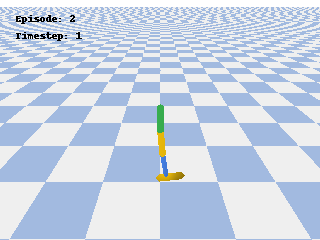

In [62]:
from IPython import display
display.Image(open('/content/drive/MyDrive/Gif/TD3_agent.gif','rb').read())